In [1]:
import pandas as pd
import geopandas as gpd
import os
from shapely.geometry import Point, Polygon, LineString, MultiPoint
from matplotlib import pyplot as plt

#import geopandas included shapefiles
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

#import external datasets, these datasets are currently for visualisation purposes only and are not necessary for the code to work
data_pth_input = r"./Data/Heat/wasteheat" #define dataset source folder
data_pth_output = r"./Data/Heat/wasteheat/" #define dataset output folder

#import climate measures xlsx
wasteheat_df_og = pd.read_excel(os.path.join(data_pth_input, "20250117_pfa_veroeffentlichung_daten.xlsx"), sheet_name="Abwärmepotentiale", header=1)
#rename columns
wasteheat_df_og = wasteheat_df_og.rename(columns={"Zuletzt\naktualisiert":"Updated", "Firmenname":"Company", "Standortname":"Location", "PLZ":"Postcode", "Ort":"City", "Straße und Hausnummer":"Adress", "Name des Abwärmepotentials":"Heat_source",
                                "Wärmemenge\npro Jahr\n(in kWh/a)":"Heat_amount_per_year [kWh/a]", "Maximale thermische\nLeistung\n(in kW)":"Max_thermal_power [kW]","Maximale\nWärmeleistung\n(in kW)":"Max_heat_output [kW]",
                                "Durchschnittliches\nTemperaturniveau\n(in °C)":"Average_temperature_level [°C]", "Durchschnittliche\ntägl. Verfügbarkeit\n(in h)":"Average Availability [h]", "Durchschnittliche tägliche\nBetriebszeit\n(in h)":"Average_daily_operating_time [h]",
                                "Verfügbarkeit am\nWochenende":"Availability_weekend", "Vorhersehbarkeit der\nVerfügbarkeit":"Predictability_of_availability", "Vorhandene Regelungsmöglichkeiten":"Existing_control_options",
                                "Leistungsprofil\nJanuar\n(in kW)":"January_power_profile [kW]", "Leistungsprofil\nFebruar\n(in kW)":"February_power_profile [kW]", "Leistungsprofil\nMärz\n(in kW)":"March_power_profile [kW]",
                                "Leistungsprofil\nApril\n(in kW)":"April_power_profile [kW]", "Leistungsprofil\nMai\n(in kW)":"May_power_profile [kW]", "Leistungsprofil\nJuni\n(in kW)":"June_power_profile [kW]",
                                "Leistungsprofil\nJuli\n(in kW)":"July_power_profile [kW]", "Leistungsprofil\nAugust\n(in kW)":"August_power_profile [kW]", "Leistungsprofil\nSeptember\n(in kW)":"September_power_profile [kW]",
                                "Leistungsprofil\nOktober\n(in kW)":"October_power_profile [kW]", "Leistungsprofil\nNovember\n(in kW)":"November_power_profile [kW]", "Leistungsprofil\nDezember\n(in kW)":"December_power_profile [kW]",
                                "Ergänzende Informationen zum Abwärmepotential":"Additional_information", "E-Mail-Adresse":"Mail", "Telefonnummer":"Phone", "Weitere Hinweise":"Further_information"
})

wasteheat_df_og["full_adress"] = wasteheat_df_og["Adress"] + ", " + wasteheat_df_og["Postcode"].astype(str) + " " + wasteheat_df_og["City"]

wasteheat_df_og

C:\Users\oliver\AppData\Local\Temp\ipykernel_3096\3308911856.py:8: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


,Updated,Company,Location,Adress,Postcode,City,Heat_source,Heat_amount_per_year [kWh/a],Max_thermal_power [kW],Average_temperature_level [°C],...,August_power_profile [kW],September_power_profile [kW],October_power_profile [kW],November_power_profile [kW],December_power_profile [kW],Additional_information,Mail,Phone,Further_information,full_adress
0,2024-12-18 10:55:00.706,1Heiz Energie GmbH,Biomasseheizkraftwerk,Angermünder Str. 68,16225,Eberswalde,Kühlwasserabwärme BMHKW,219566280.0,27456.0,33.0,...,27000.0,27000.0,27000.0,27000.0,27000.0,Es handelt sich um die Abwärme aus dem Kühlwas...,NaN,NaN,NaN,"Angermünder Str. 68, 16225 Eberswalde"
1,2024-12-18 10:55:00.706,1Heiz Energie GmbH,Biomasseheizkraftwerk,Angermünder Str. 68,16225,Eberswalde,Rauchgase Biomasseheizkraftwerk,23093847.0,3313.0,160.0,...,2544.0,2490.0,2624.0,2887.0,2948.0,Es handelt sich um die Rauchgase aus dem Bioma...,NaN,NaN,NaN,"Angermünder Str. 68, 16225 Eberswalde"
2,2024-12-30 14:10:35.841,1Heiz Pellets AG Eberswalde,Pelletswerk Eberswalde,Angermünder Str. 1,16225,Eberswalde,Abwärme Pellettrockner,31000000.0,12000.0,50.0,...,6.0,7.0,7.0,8.0,8.0,Es handelt sich um die Abwärme aus einem Pelle...,NaN,NaN,NaN,"Angermünder Str. 1, 16225 Eberswalde"
3,2024-12-19 12:36:59.106,2 R Kunststofftechnik GmbH & Co. KG,Hauptstandort,Ohmstr. 2,85301,Schweitenkirchen,Kompressor,35000.0,16.0,30.0,...,10.0,10.0,8.0,7.0,7.0,NaN,philipp.kissel@zwei-r.com,08444927644,NaN,"Ohmstr. 2, 85301 Schweitenkirchen"
4,2024-12-19 12:36:59.106,2 R Kunststofftechnik GmbH & Co. KG,Hauptstandort,Ohmstr. 2,85301,Schweitenkirchen,Kühlanlage,1047000.0,280.0,26.0,...,150.0,140.0,120.0,100.0,90.0,NaN,philipp.kissel@zwei-r.com,08444927644,NaN,"Ohmstr. 2, 85301 Schweitenkirchen"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19060,2024-12-19 12:54:10.149,Zweckverband Tierische Nebenprodukte Süd-Baden...,ZTN Süd,Pflughölzle 1,88447,Warthausen,Sterilisator 4,1170000.0,1747.0,95.0,...,97500.0,97500.0,97500.0,97500.0,97500.0,Das Abwärmepotential entsteht während eines da...,kevin.dorner@ztn-sued.de,07356937115,NaN,"Pflughölzle 1, 88447 Warthausen"
19061,2024-12-19 12:54:10.150,Zweckverband Tierische Nebenprodukte Süd-Baden...,ZTN Süd,Pflughölzle 1,88447,Warthausen,Trockner 1,17170000.0,5825.0,95.0,...,1430833.0,1430833.0,1430833.0,1430833.0,1430833.0,Das Potential entsteht während eines dampfgest...,kevin.dorner@ztn-sued.de,07356937115,NaN,"Pflughölzle 1, 88447 Warthausen"
19062,2024-12-19 12:54:10.150,Zweckverband Tierische Nebenprodukte Süd-Baden...,ZTN Süd,Pflughölzle 1,88447,Warthausen,Trockner 2,5670000.0,2912.0,95.0,...,472500.0,472500.0,472500.0,472500.0,472500.0,Das Potential entsteht während eines dampfgest...,kevin.dorner@ztn-sued.de,07356937115,NaN,"Pflughölzle 1, 88447 Warthausen"
19063,2024-12-20 14:18:50.295,Zwiesel Kristallglas AG,Zwiesel Kristallglas AG,Dr.-Schott-Straße 35,94227,Zwiesel,WRG Heizungskreislauf,136650.0,865.0,80.0,...,49.0,77.0,0.0,0.0,0.0,Wärmerückgewinnung aus Kompressoren und Rauchg...,NaN,NaN,NaN,"Dr.-Schott-Straße 35, 94227 Zwiesel"


In [17]:
#Translate address into coordinates
import pandas as pd
import geopandas as gpd
from geopy.geocoders import Nominatim
from geopy.exc import GeocoderServiceError

wasteheat_df = wasteheat_df_og.copy()
# wasteheat_df = wasteheat_df.head(2) # Limit the number of rows to 10 for testing purposes
#drop updated column
wasteheat_df = wasteheat_df.drop(columns=["Updated"])

# Initialize the geolocator
geolocator = Nominatim(user_agent="myGeocoder")

# Function to geocode an address
def geocode_address(address):
    try:
        return geolocator.geocode(address)
    except GeocoderServiceError as e:
        print(f"Geocoding error: {e}")
        return None

# Initialize the complete dataframe and the error dataframe
complete_df = pd.DataFrame()
error_df = pd.DataFrame()

# Process the dataframe in chunks of 200 rows
chunk_size = 200
for i in range(0, len(wasteheat_df), chunk_size):
    chunk = wasteheat_df.iloc[i:i+chunk_size]
    
    # Create a new column 'Coordinates' to store the location data
    chunk['Coordinates'] = chunk['full_adress'].apply(geocode_address)
    
    # Create a new column 'Latitude' to store the latitude data
    chunk['Latitude'] = chunk['Coordinates'].apply(lambda x: x.latitude if x is not None else None)
    
    # Create a new column 'Longitude' to store the longitude data
    chunk['Longitude'] = chunk['Coordinates'].apply(lambda x: x.longitude if x is not None else None)
    
    # Drop the 'Coordinates' column as it is no longer needed
    chunk = chunk.drop(['Coordinates'], axis=1)
    
    # Create a geopandas dataframe
    chunk_gdf = gpd.GeoDataFrame(chunk, geometry=gpd.points_from_xy(chunk.Longitude, chunk.Latitude))
    chunk_gdf.crs = "EPSG:4326"
    
    # Append the chunk to the complete dataframe
    if complete_df.empty:
        complete_df = chunk_gdf
    else:
        complete_df = pd.concat([complete_df, chunk_gdf], ignore_index=True)
    
    # Save the complete dataframe to a file
    complete_df.to_file(os.path.join(data_pth_output, "shapefiles/complete_df_new.shp"))
    complete_df.to_csv(os.path.join(data_pth_output, "complete_df_new.csv"), index=False, sep=";", encoding="utf-8-sig")
    
    # Create an error dataframe
    error_chunk = chunk[chunk['Latitude'].isnull()]
    if not error_chunk.empty:
        if error_df.empty:
            error_df = error_chunk
        else:
            error_df = pd.concat([error_df, error_chunk], ignore_index=True)
    
    # Save the error dataframe to a file
    error_df.to_csv(os.path.join(data_pth_output, "error_df_new.csv"), index=False, sep=";", encoding="utf-8-sig")

# Print the DataFrame
wasteheat_df

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Im+Moore+1%2C+49356+Diepholz&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Sch%C3%B6nfeldstra%C3%9Fe+12a%2C+83022+Rosenheim&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Hasenkamp+15%2C+25436+Tornesch&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstr

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Kasteler+Str.+45%2C+65203+Wiesbaden&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Werkstra%C3%9Fe+1%2C+15890+Eisenh%C3%BCttenstadt&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Mei%C3%9Fner+Stra%C3%9Fe+35%2C+1445+Radebeul&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Flurstra%C3%9Fe+37%2C+8056+Zwickau&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(hos

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Kap-Horn-+Strasse+12%2C+28237+Bremen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Mittelstetter+Str.+40%2C+86641+Rain&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Vorster+Heidweg+12+-+14%2C+47661+Issum&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.open

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Bahnhofstr.+55+%2F+Schillerstr.+18%2C+78570+M%C3%BChlheim+a.+d.+Donau&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Sedanstra%C3%9Fe+1%2C+79098+Freiburg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Rheinstra%C3%9Fe+158-168%2C+45478+M%C3%BClheim&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Robert-Hansen-Strasse+1%2C+89257+Illertissen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Carl-Bosch-Stra%C3%9Fe+38%2C+67056+Ludwigshafen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Carl-Bosch-Stra%C3%9Fe+38%2C+67056+Ludwigshafen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnec

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Carl-Bosch-Stra%C3%9Fe+38%2C+67056+Ludwigshafen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=An+der+B+107%2C+4680+Colditz&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Chemnitzer+Stra%C3%9Fe+61b%2C+9669+Frankenberg+%28Sa.%29&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Chemnitzer+Stra%C3%9Fe+61b%2C+9669+Frankenberg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Residenzstra%C3%9Fe+1%2C+33104+Paderborn&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Kirchstra%C3%9Fe+5%2C+55257+Budenheim&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Geraer+Str.+10%2C+7570+Berga-W%C3%BCnschendorf&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Hamburger+Stra%C3%9Fe+8%2C+24558+Henstedt-Ulzburg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPo

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Am+Harbarnser+Bahnhof+1%2C+31195+31195+Lamspringe&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Konrad-Adenauer-Stra%C3%9Fe+17%2C+55218+Ingelheim&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Str.+des+Friedens+48A%2C+19357+Karst%C3%A4dt&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Marnheimer+Str.+85%2F87%2C+67292+Kirchheimbolanden&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Zum+Eisengie%C3%9Fer+1%2C+97816+Lohr&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Junkersstra%C3%9Fe+20+-+24%2C+73249+Wernau&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(h

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Gutenbergstr.+1%2C+77654+Offenburg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Bergstra%C3%9Fe+4%2C+8237+Wernesgr%C3%BCn+OT+Steinberg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Garn-stadter+Stra%C3%9Fe+38%2C+96237+Ebersdorf&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnection

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Reichenbacher+Stra%C3%9Fe+89%2C+8056+Zwickau&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Schlacht+2%2C+58791+Werdohl&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Pirkm%C3%BChle+14-16%2C+92712+Pirk&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Marie-Curie-Str.+1%2C+79539+L%C3%B6rrach&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetma

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Neusser+Landstra%C3%9Fe+Geb%C3%A4ude+8%2C+41538+Dormagen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Waterbergstra%C3%9Fe+14%2C+28237+Bremen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=R%C3%B6merstra%C3%9Fe+3%2C+86637+Wertingen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnect

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Ernst-August-Platz+1%2C+30159+Hannover&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Bahnhofstr.+21-39%2C+37431+Bad+Lauterberg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Vor+der+Hecke+11%2C+34355+Lutterberg+%2F+Kassel&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Vor+der+Hecke+11%2C+34355+Lutterberg+%2F+Kassel&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Industriestra%C3%9Fe+1%2C+66129+Saarbr%C3%BCcken&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSCo

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=R%C3%B6ntgenstrasse+1%2C+6120+Halle&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Freundschaft+1%2C+95691+Hohenberg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Bettenkamp+1%2C+57392+Schmallenberg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreet

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Revalstra%C3%9Fe+1%2C+23560+L%C3%BCbeck&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Hauptstra%C3%9Fe+39-41%2C+63846+Laufach&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Ziegelstr.3%2C+1662+Meissen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Robert-Bosch-Str.+7%2C+40789+Monheim&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Nassauweg+7%2C+1662+Mei%C3%9Fen+&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Heinrich-Hertz-Stra%C3%9Fe+17%2C+24837+Schleswig&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Industriestra%C3%9Fe+4%2C+69509+M%C3%B6rlenbach&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Am+Rahmen+17%2C+9661+Striegistal&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Oststrasse+16%2C+46483+Wesel&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Am+Bahnhof+6%2C+78199+Br%C3%A4unlingen-D%C3%B6ggingen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Hauptstrasse+106%2C+84088+Neufahrn&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Lutherstra%C3%9Fe+87%2C+9126+Chemnitz&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Geschwister+Scholl+Stra%C3%9Fe+23%2C+65197+Wiesbaden&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Am+Gipswerk+300%2C+91628+Steinsfeld&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host=

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Grenzweg+4-2%2C+26197+Gro%C3%9Fenkneten&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Junghansstra%C3%9Fe+5%2C+1277+Dresden&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Posthalterweg+10%2C+26129+Oldenburg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.op

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Engelschalkstra%C3%9Fe+1%2C+86316+Friedberg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Ringstra%C3%9Fe+13%2C+99885+Ohrdruf&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Stolberger+Stra%C3%9F3+351-353%2C+50933+K%C3%B6ln&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(ho

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Trift+10%2C+6502+Ilsenburg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Uferweg+5%2C+74889+Sinsheim&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Am+Werk+9%3B+02788+Zittau%2C+2788+Zittau+OT+Hirschfelde&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.opens

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Industriestra%C3%9Fe+1%2C+94559+Niederwinkling&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Hellinger+Str.+1%2C+97486+K%C3%B6nigsberg+i.+Bay.&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Ruhrtal+2%2C+58456+Witten&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Papenweg+6%2C+32699+Extertal&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Richard-Wagner-Stra%C3%9Fe+24%2C+59063+Hamm&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Albert-Schweitzer-Str.+15%2C+35260+Stadtallendorf&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nom

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Kurpfalzring+109+-+113%2C+69123+Heidelberg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=In+der+Grund+85%2C+28832+Achim%2FEmbsen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Industriestra%C3%9Fe+10%2C+39340+Haldensleben&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(hos

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Karl-Marx-Stra%C3%9Fe+24%2C+7381+P%C3%B6%C3%9Fneck&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Industriestra%C3%9Fe+1%2C+67063+Ludwigshafen+am+Rhein&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Stein+22%2C+95703+Pl%C3%B6%C3%9Fberg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Forster+Stra%C3%9Fe+72%2C+3172+Guben&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Landstr.+1%2C+79261+Gutach&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=S%C3%BCd-Chemie-Str.3%2C+93309+Kelheim&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=S%C3%BCd-Chemie-Str.3%2C+93309+Kelheim&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=S%C3%BCd-Chemie-Str.3%2C+93309+Kelheim&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Friedrich-Ebert-+Stra%C3%9Fe+87%2C+58454+Witten&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Holstenstra%C3%9Fe+2%2C+22767+Hamburg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Leipziger+Str.+45%2C+4435+Schkeuditz&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Bergstr.+3%2C+98617+Meiningen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetm

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Ringstra%C3%9Fe+49%2C+53721+Siegburg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=R%C3%B6ntgenstr.+2%2C+8529+Plauen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Lauchaer+Stra%C3%9Fe+1%2C+6647+An+der+Poststra%C3%9Fe+OT+Klosterh%C3%A4seler&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTP

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Martina+H%C3%B6rbiger+Str.5%2C+86956+Schongau&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Frankfurter+Stra%C3%9Fe+45-65%2C+65479+Raunheim&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Fraunhofer+Str.+2%2C+4178+Leipzig&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Siedlerweg+11%2C+15562+R%C3%BCdersdorf&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=ranz-Kollmann-Str.+5%2C+86899+Landsberg+am+Lech&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Ebersdorfer+Stra%C3%9Fe+101%2C+96465+Neustadt+b.+Coburg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConn

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=R%C3%B6merstra%C3%9Fe+10%2C+85375+Neufahrn&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Holtdorfer+Stra%C3%9Fe+35%2C+53229+Bonn&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Breite+Stra%C3%9Fe+89%2C+23552+L%C3%BCbeck&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Ringstra%C3%9Fe+20%2C+39240+Calbe&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Ringstra%C3%9Fe+20%2C+39240+Calbe&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.opens

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Frankfurter+Stra%C3%9Fe+100%2C+36414+Unterbreizbach&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Karl-Marx-Stra%C3%9Fe+66%2C+12043+Berlin-Neuk%C3%B6lln&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Breite+Stra%C3%9Fe+19-21a%2C+13187+Berlin-Pankow&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Georg-Schumann-Stra%C3%9Fe+290%2C+4159+Leipzig-M%C3%B6ckern&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Sonnenstra%C3%9Fe+7%2C+9648+Mittweida&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Friedrich-Schiller-Stra%C3%9Fe+5b%2C+3172+Guben&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSC

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=B%C3%B6kenf%C3%B6rder+Stra%C3%9Fe+181-183%2C+59557+Lippstadt-Kernstadt&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Babelsberger+Stra%C3%9Fe+16%2C+14473+Potsdam-Innenstadt&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Rosenh%C3%BCgel+5%2C+27721+Ritterhude&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geoc

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=M%C3%BCnchener+Stra%C3%9Fe+146%2C+85051+Ingolstadt&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Richard-Wagner-Stra%C3%9Fe+40%2C+85057+Ingolstadt-Nordwest&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Danziger+Stra%C3%9Fe+1%2C+85221+Dachau&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTT

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Bergstra%C3%9Fe+S%C3%BCd+14%2C+98694+Ilmenau+OT+Gehren&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Geschwister-Scholl-Str.+2%2C+2794+Leutersdorf&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Otto-Hahn-Stra%C3%9Fe+12-14%2C+42477+Radevormwald&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: H

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Chempark+0%2C+41538+Dormagen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Insel+W%C3%B6rth+1%2C+89407+Dillingen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=R%C3%B6merstra%C3%9Fe+1%2C+89415+Lauingen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Riedstra%C3%9Fe+4%2C+89443+Schwenningen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nomina

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Lise-Meitner-Str.+1%2C+28790+Bremen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Ahornstr.+%2FOVZ+Freienbrink+6%2C+15537+Gr%C3%BCnheide-Freienbrink&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Max-Immelmann-Allee+23%2C+79427+Freiburg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSCon

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Markschell+3%2C+24966+S%C3%B6rup&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Birkenweg+3%2C+63801+Kleinostheim&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Tillystr.+17-19%2C+30459+Hannover&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Bahnhofstra%C3%9Fe+21%2C+56424+Moschheim&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstr

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=S%C3%BCdstrasse+44%2C+6242+Ro%C3%9Fbach&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Leipziger+Stra%C3%9Fe+7-13%2C+1097+Dresden&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Edouard-Michelin-Platz+1%2C+66424+Homburg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Edouard-Michelin-Platz+1%2C+66424+Homburg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Mielestra%C3%9Fe+2%2C+33611+Bielefeld&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Industriestr.+4%2C+63927+B%C3%BCrgstadt&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Herbert-Werner-Stra%C3%9Fe+0%2C+59174+Kamen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Carl-Duisberg-Stra%C3%9Fe+0%2C+45772+Marl&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Duisburger+Str.+301a%2C+47166+Duisburg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='n

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Robert-Bosch+Str.8+%2C+84539+Ampfing&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Otto-Hahn-Stra%C3%9Fe+1%2C+68169+Mannheim&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Otto-Hahn-Stra%C3%9Fe+1%2C+68169+Mannheim&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nomin

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Marie-Curie+Stra%C3%9Fe%2C+66763+Dillingen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Gie%C3%9Ferweg+10%2C+38855+Wernigerode&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Postweg+205%2C+21218+Seevetal&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.open

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Industriestra%C3%9Fe+6%2C+54579+%C3%9Cxheim&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Industriestra%C3%9Fe+6%2C+54579+%C3%9Cxheim&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Waldstra%C3%9Fe+56%2C+33415+Verl&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nomin

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Industriestra%C3%9Fe+12%2C+1936+Schwepnitz&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Industriestra%C3%9Fe+23%2C+97483+Eltmann&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Kerastra%C3%9Fe+1%2C+4703+Leisnig&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Dresdner+Stra%C3%9Fe+321%2C+1705+Freital&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Industriestra%C3%9Fe+23%2C+97483+Eltmann&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Rudolf-Diesel+Stra%C3%9Fe+19%2C+89264+Wei%C3%9Fenhorn&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionP

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Westring+19+-+21%2C+59759+Arnsberg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Westring+19+-+21%2C+59759+Arnsberg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Werksstra%C3%9Fe+3%2C+92551+Stulln&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetm

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Hermann-Staudinger-Stra%C3%9Fe+6%2C+95233+Helmbrechts&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=EPS+Anlage+I-119%2C+6258+Schkopau&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Herderstra%C3%9Fe+2%2C+83512+Wasserburg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Rudolf-Winkel-Str.+1%2C+37097+G%C3%B6ttingen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Rudolf-Winkel-Str.+1%2C+37097+G%C3%B6ttingen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Meyer+Hellmer+1%2C+26919+Brake&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nomin

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Dr.-C.-Otto-Str.+222%2C+44879+Bochum&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Industriestra%C3%9Fe+24%2C+56472+Hof&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Industriestra%C3%9Fe+24%2C+56472+Hof&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.opens

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Friedrich-Ebert-Str.+78-84%2C+95448+Bayreuth&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Glasstra%C3%9Fe+1%2C+52134+Herzogenrath&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Hauptstr.+67%2C+87787+Wolfertschwenden&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Kaiser-Wilhelm-Allee+40%2C+51369+Leverkusen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Friedrich-Ludwig-Bauer-Stra%C3%9Fe+5%2C+85748+M%C3%BCnchen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Raiffeisenstra%C3%9Fe+37%2C+68789+St.+Leon-Rot&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HT

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Ziegeleistra%C3%9Fe+1%2C+84367+Zeilarn&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Norisstra%C3%9Fe+18%2C+91154+Roth&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Ringstra%C3%9Fe+2%2C+6188+Landsberg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstr

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Sch%C3%BCtzstr.+12%2C+56242+Selters&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Sch%C3%BCtzstra%C3%9Fe+12%2C+56242+Selters&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Berliner+Stra%C3%9Fe+1-3%2C+23611+Bad+Schwartau&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host=

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=H%C3%BCttenfeld-Au%C3%9Ferhalb+5%2C+68623+Lampertheim&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Rosenstra%C3%9Fe+8%2C+35037+Marburg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Am+Haupttor+Geb.+8322%2C+6237+Leuna&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Gro%C3%9Fer+Felsen+1%2C+78253+Eigeltingen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Werner-von-Siemens-Stra%C3%9Fe+3%2C+24568+Kaltenkirchen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Vogesenstra%C3%9Fe+5%2C+63811+Stockstadt&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnecti

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Waldstra%C3%9Fe+4%2C+4571++R%C3%B6tha&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Aluminiumstra%C3%9Fe+3%2C+41515+Grevenbroich&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Aluminiumstra%C3%9Fe+8%2C+84513+T%C3%B6ging&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host=

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Westbahnstra%C3%9Fe+1%2C+3130+Spremberg&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Lindenallee+1%2C+6712+Zeitz&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Friedrichstra%C3%9Fe+41%2C+1067+Dresden&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstre

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Lindenstra%C3%9Fe+9%2C+27356+Rotenburg+%28W%C3%BCmme%29&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Bismarckstra%C3%9Fe+146-148%2C+66121+Saarbr%C3%BCcken&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Eisenh%C3%BCttentrift+3%2C+6526+Sangerhausen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding erro

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Fabrikstr.+1%2C+74838+Limbach&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Industriestr.+40%2C+53909+Z%C3%BClpich&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Siemensstra%C3%9Fe+10a%2C+21509+Glinde&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Hannoversche+Stra%C3%9Fe+2%2C+34134+Kassel&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nomin

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Berliner+Stra%C3%9Fe+1%2C+36251+Bad+Hersfeld&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Industrie-+u.+Gewerbegebiet+Lauta+Stra%C3%9Fe+B+Nr.+5%2C+2991+Lauta&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Am+Gewerbegebiet+36-38%2C+27243+Gro%C3%9F+Ippener&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocod

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Ringstra%C3%9Fe+10%2C+1662+Mei%C3%9Fen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Industriestra%C3%9Fe+2%2C+40789+Monheim&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Dr.+W.+-+K%C3%BClz-Str.+21%2C+8209+Auerbach&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nom

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Carl-Jakob-Kolb-Weg+2%2C+97877+Wertheim&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Beetwiese+2%2C+35108+Allendorf&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Wiederholtstra%C3%9Fe+1%2C+59439+Holzwickede&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Bernecker+Stra%C3%9Fe+58%2C+95509+Marktschorgast&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Neue+Bergstra%C3%9Fe+6%2C+13585+Berlin&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Zelgle+4%2C+79736+Rickenbach&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Bahnhofstra%C3%9Fe+46%2C+8233+Treuen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Zittauer+Stra%C3%9Fe+67%2C+2681+Wilthen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Johannes-Hess-Strasse+24%2C+84489+Burghausen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nomi

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Lohm%C3%BChle+3-5%2C+90579+Langenzenn&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=B%C3%BCrgermeister-Wohlfahrt-Str.+41b%2C+86343+K%C3%B6nigsbrunn&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Industriestra%C3%9Fe+11%2C+49751+S%C3%B6gel&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSC

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Am+Westufer+4%2C+4463+Gro%C3%9Fp%C3%B6sna&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Wiegand-Glas-Stra%C3%9Fe+1%2C+98701+Gro%C3%9Fbreitenbach&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Carl-Zeiss-Stra%C3%9Fe+7%2C+73441+Bopfingen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConn

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Heinrich-Heine-Strasse+80%2C+2943+Weisswasser%2FOberlausitz&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Haffburg+8a%2C+23970+Wismar&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Industriestra%C3%9Fe+7%2C+4808+Wurzen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Gerwigstrasse+9%2C+79843+Loeffingen&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Gewerbegebiet+an+der+B95+2a%2C+9427+Ehrenfriedersdorf&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))
Geocoding error: HTTPSConnectionPool(host

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Geocoding error: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Chemnitztalstrasse+1%2C+9217+Burgst%C3%A4dt&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))


C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\oliver\AppData\Local\Temp\ipykernel_18808\387082074.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

,Company,Location,Adress,Postcode,City,Heat_source,Heat_amount_per_year [kWh/a],Max_thermal_power [kW],Average_temperature_level [°C],Average Availability [h],...,August_power_profile [kW],September_power_profile [kW],October_power_profile [kW],November_power_profile [kW],December_power_profile [kW],Additional_information,Mail,Phone,Further_information,full_adress
0,1Heiz Energie GmbH,Biomasseheizkraftwerk,Angermünder Str. 68,16225,Eberswalde,Kühlwasserabwärme BMHKW,219566280.0,27456.0,33.0,24,...,27000.0,27000.0,27000.0,27000.0,27000.0,Es handelt sich um die Abwärme aus dem Kühlwas...,NaN,NaN,NaN,"Angermünder Str. 68, 16225 Eberswalde"
1,1Heiz Energie GmbH,Biomasseheizkraftwerk,Angermünder Str. 68,16225,Eberswalde,Rauchgase Biomasseheizkraftwerk,23093847.0,3313.0,160.0,24,...,2544.0,2490.0,2624.0,2887.0,2948.0,Es handelt sich um die Rauchgase aus dem Bioma...,NaN,NaN,NaN,"Angermünder Str. 68, 16225 Eberswalde"
2,1Heiz Pellets AG Eberswalde,Pelletswerk Eberswalde,Angermünder Str. 1,16225,Eberswalde,Abwärme Pellettrockner,31000000.0,12000.0,50.0,8,...,6.0,7.0,7.0,8.0,8.0,Es handelt sich um die Abwärme aus einem Pelle...,NaN,NaN,NaN,"Angermünder Str. 1, 16225 Eberswalde"
3,2 R Kunststofftechnik GmbH & Co. KG,Hauptstandort,Ohmstr. 2,85301,Schweitenkirchen,Kompressor,35000.0,16.0,30.0,16,...,10.0,10.0,8.0,7.0,7.0,NaN,philipp.kissel@zwei-r.com,08444927644,NaN,"Ohmstr. 2, 85301 Schweitenkirchen"
4,2 R Kunststofftechnik GmbH & Co. KG,Hauptstandort,Ohmstr. 2,85301,Schweitenkirchen,Kühlanlage,1047000.0,280.0,26.0,16,...,150.0,140.0,120.0,100.0,90.0,NaN,philipp.kissel@zwei-r.com,08444927644,NaN,"Ohmstr. 2, 85301 Schweitenkirchen"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19060,Zweckverband Tierische Nebenprodukte Süd-Baden...,ZTN Süd,Pflughölzle 1,88447,Warthausen,Sterilisator 4,1170000.0,1747.0,95.0,3,...,97500.0,97500.0,97500.0,97500.0,97500.0,Das Abwärmepotential entsteht während eines da...,kevin.dorner@ztn-sued.de,07356937115,NaN,"Pflughölzle 1, 88447 Warthausen"
19061,Zweckverband Tierische Nebenprodukte Süd-Baden...,ZTN Süd,Pflughölzle 1,88447,Warthausen,Trockner 1,17170000.0,5825.0,95.0,10,...,1430833.0,1430833.0,1430833.0,1430833.0,1430833.0,Das Potential entsteht während eines dampfgest...,kevin.dorner@ztn-sued.de,07356937115,NaN,"Pflughölzle 1, 88447 Warthausen"
19062,Zweckverband Tierische Nebenprodukte Süd-Baden...,ZTN Süd,Pflughölzle 1,88447,Warthausen,Trockner 2,5670000.0,2912.0,95.0,8,...,472500.0,472500.0,472500.0,472500.0,472500.0,Das Potential entsteht während eines dampfgest...,kevin.dorner@ztn-sued.de,07356937115,NaN,"Pflughölzle 1, 88447 Warthausen"
19063,Zwiesel Kristallglas AG,Zwiesel Kristallglas AG,Dr.-Schott-Straße 35,94227,Zwiesel,WRG Heizungskreislauf,136650.0,865.0,80.0,24,...,49.0,77.0,0.0,0.0,0.0,Wärmerückgewinnung aus Kompressoren und Rauchg...,NaN,NaN,NaN,"Dr.-Schott-Straße 35, 94227 Zwiesel"


In [33]:
wasteheat_df_old = complete_df.copy()
wasteheat_df_old

c:\Users\oliver\miniconda3_8\envs\streamlit\Lib\site-packages\shapely\io.py:105: RuntimeWarning:

invalid value encountered in to_wkt

c:\Users\oliver\miniconda3_8\envs\streamlit\Lib\site-packages\shapely\io.py:105: RuntimeWarning:

invalid value encountered in to_wkt



,Company,Location,Adress,Postcode,City,Heat_source,Heat_amount_per_year [kWh/a],Max_thermal_power [kW],Average_temperature_level [°C],Average Availability [h],...,November_power_profile [kW],December_power_profile [kW],Additional_information,Mail,Phone,Further_information,full_adress,Latitude,Longitude,geometry
0,1Heiz Energie GmbH,Biomasseheizkraftwerk,Angermünder Str. 68,16225,Eberswalde,Kühlwasserabwärme BMHKW,219566280.0,27456.0,33.0,24,...,27000.0,27000.0,Es handelt sich um die Abwärme aus dem Kühlwas...,NaN,NaN,NaN,"Angermünder Str. 68, 16225 Eberswalde",52.851352,13.776140,POINT (13.77614 52.85135)
1,1Heiz Energie GmbH,Biomasseheizkraftwerk,Angermünder Str. 68,16225,Eberswalde,Rauchgase Biomasseheizkraftwerk,23093847.0,3313.0,160.0,24,...,2887.0,2948.0,Es handelt sich um die Rauchgase aus dem Bioma...,NaN,NaN,NaN,"Angermünder Str. 68, 16225 Eberswalde",52.851352,13.776140,POINT (13.77614 52.85135)
2,1Heiz Pellets AG Eberswalde,Pelletswerk Eberswalde,Angermünder Str. 1,16225,Eberswalde,Abwärme Pellettrockner,31000000.0,12000.0,50.0,8,...,8.0,8.0,Es handelt sich um die Abwärme aus einem Pelle...,NaN,NaN,NaN,"Angermünder Str. 1, 16225 Eberswalde",52.841018,13.735366,POINT (13.73537 52.84102)
3,2 R Kunststofftechnik GmbH & Co. KG,Hauptstandort,Ohmstr. 2,85301,Schweitenkirchen,Kompressor,35000.0,16.0,30.0,16,...,7.0,7.0,NaN,philipp.kissel@zwei-r.com,08444927644,NaN,"Ohmstr. 2, 85301 Schweitenkirchen",48.499879,11.607746,POINT (11.60775 48.49988)
4,2 R Kunststofftechnik GmbH & Co. KG,Hauptstandort,Ohmstr. 2,85301,Schweitenkirchen,Kühlanlage,1047000.0,280.0,26.0,16,...,100.0,90.0,NaN,philipp.kissel@zwei-r.com,08444927644,NaN,"Ohmstr. 2, 85301 Schweitenkirchen",48.499879,11.607746,POINT (11.60775 48.49988)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19060,Zweckverband Tierische Nebenprodukte Süd-Baden...,ZTN Süd,Pflughölzle 1,88447,Warthausen,Sterilisator 4,1170000.0,1747.0,95.0,3,...,97500.0,97500.0,Das Abwärmepotential entsteht während eines da...,kevin.dorner@ztn-sued.de,07356937115,NaN,"Pflughölzle 1, 88447 Warthausen",NaN,NaN,POINT (nan nan)
19061,Zweckverband Tierische Nebenprodukte Süd-Baden...,ZTN Süd,Pflughölzle 1,88447,Warthausen,Trockner 1,17170000.0,5825.0,95.0,10,...,1430833.0,1430833.0,Das Potential entsteht während eines dampfgest...,kevin.dorner@ztn-sued.de,07356937115,NaN,"Pflughölzle 1, 88447 Warthausen",NaN,NaN,POINT (nan nan)
19062,Zweckverband Tierische Nebenprodukte Süd-Baden...,ZTN Süd,Pflughölzle 1,88447,Warthausen,Trockner 2,5670000.0,2912.0,95.0,8,...,472500.0,472500.0,Das Potential entsteht während eines dampfgest...,kevin.dorner@ztn-sued.de,07356937115,NaN,"Pflughölzle 1, 88447 Warthausen",NaN,NaN,POINT (nan nan)
19063,Zwiesel Kristallglas AG,Zwiesel Kristallglas AG,Dr.-Schott-Straße 35,94227,Zwiesel,WRG Heizungskreislauf,136650.0,865.0,80.0,24,...,0.0,0.0,Wärmerückgewinnung aus Kompressoren und Rauchg...,NaN,NaN,NaN,"Dr.-Schott-Straße 35, 94227 Zwiesel",49.017556,13.228020,POINT (13.22802 49.01756)


In [43]:
import geopandas as gpd
import plotly.express as px

#import complete_df_new.csv from shapefiles input path
wasteheat_df_dataset = pd.read_csv(os.path.join(data_pth_output, "complete_df_new.csv"), sep=";", encoding="utf-8-sig")
# Convert the DataFrame to a GeoDataFrame
wasteheat_df_dataset = gpd.GeoDataFrame(wasteheat_df_dataset, geometry=gpd.points_from_xy(wasteheat_df_dataset.Longitude, wasteheat_df_dataset.Latitude))
# Set the coordinate reference system (CRS) to EPSG:4326
wasteheat_df_dataset.crs = "EPSG:4326"

gdf = wasteheat_df_dataset.copy()

minx, miny, maxx, maxy = gdf.total_bounds

# Extract latitude and longitude from the GeoDataFrame
gdf['lon'] = gdf.geometry.x
gdf['lat'] = gdf.geometry.y

# Calculate the center of the map
center_lon = (minx + maxx) / 2
center_lat = (miny + maxy) / 2

# Calculate the midpoint of the temperature range
temp_midpoint = (gdf['Average_temperature_level [°C]'].min() + gdf['Average_temperature_level [°C]'].max()) / 2

# Create a Plotly scatter mapbox plot
fig = px.scatter_mapbox(
 gdf,
 lat='lat',
 lon='lon',
 hover_name="Location",
 hover_data=["Company", "Location", "Heat_source", "City", "Heat_amount_per_year [kWh/a]", "Max_thermal_power [kW]", "Average_temperature_level [°C]"],
 size=gdf['Heat_amount_per_year [kWh/a]'], # Increase the size of the points
 color='Average_temperature_level [°C]',
 color_continuous_scale = [
    (0.00, "#03055B"), (0.20, "#0343DF"), (0.50, "#FF9900"), 
    (0.65, "#FF7A00"), (0.80, "#E64C3C"), (0.90, "#C3382B"), 
    (1.00, "#8B0A1A")], # Color scale relative to average temperature level (hot/cold) RdYlBu_r
 color_continuous_midpoint=200, #temp_midpoint, # Set the midpoint of the color scale
 range_color=(0, 400), # Set the range of the color scale
 size_max=100, # Increase the size of the points
 opacity=0.5, # Increase transparency to 50%
 height=1100,
 width=1100
)

# # Update layout for better visualization
# fig.update_layout(
#     mapbox_style="carto-positron",
#     mapbox_center={"lat": 51.1657, "lon": 10.4515}, # Center of Germany
#     mapbox_zoom=6, # Zoom level for Germany
#     margin={"r": 0, "t": 0, "l": 0, "b": 30},
#     # Update the coloraxis to make the colorscale vertical
#     coloraxis_colorbar_title="Average Temperature Level [°C]",
#     coloraxis_colorbar_title_side="right",  # This is the key to making it vertical
#     #coloraxis_colorbar_tickfont_size=12,  # Optional: Adjust font size
#     #coloraxis_colorbar_len=0.7,  # Optional: Adjust length of the colorbar (value between 0 and 1)
#     coloraxis_colorbar_orient="h",  # Actually, this should be "v" for vertical, but Plotly's default for 'title_side="right"' is vertical, so we keep it as is or set to "v" explicitly if needed
#     #coloraxis_colorbar_x=-0.15,  # Optional: Adjust x-position of the colorbar (negative moves left)
#     #coloraxis_colorbar_y=0.5,  # Optional: Adjust y-position of the colorbar (0.5 centers it vertically)
# )

# Update layout for better visualization
fig.update_layout(
 mapbox_style="carto-positron",
 mapbox_center={"lat": 51.1657, "lon": 10.4515}, # Center of Germany
 mapbox_zoom=6, # Zoom level for Germany
 margin={"r": 0, "t": 0, "l": 0, "b": 30}
)
# Insert title
fig.update_layout(title_text="Waste Heat Sources in Germany")
# Insert legend that says that the size of the points represents the amount of waste heat produced
fig.update_layout(legend_title_text='Waste Heat Amount [kWh/a]', legend_title_font_size=100, legend_title_side='top')

#include source link as annotation und the plot
fig.add_annotation(
 text="Source: https://www.bfee-online.de/BfEE/DE/Effizienzpolitik/Plattform_fuer_Abwaerme/plattform_fuer_abwaerme_node.html",
 showarrow=False,
 xref="paper",
 yref="paper",
 x=0.99,
 y=-0.025
)

# Show the plot
fig.show()

c:\Users\oliver\miniconda3_8\envs\streamlit\Lib\site-packages\shapely\measurement.py:103: RuntimeWarning:

invalid value encountered in bounds



In [26]:
fig = px.colors.sequential.swatches_continuous() 
fig.show() 

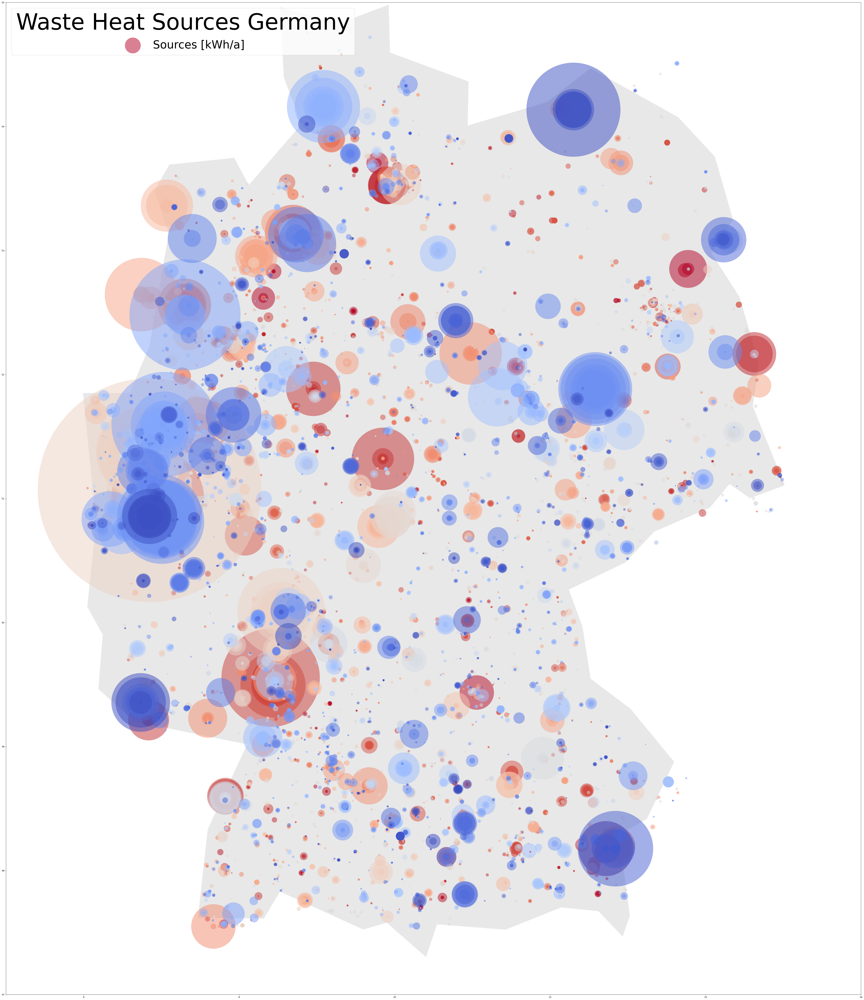

In [104]:
base = world.plot(color='#a8a8a8', linewidth=0.5, edgecolor='white', figsize=(100,80), alpha=0)
world_regions = world.dissolve(by="iso_a3", aggfunc="sum")
#world_regions.plot(ax=base, color="lightgrey", linewidth=1, edgecolor='white', alpha=0.5)
#plot Germany
DEU = world[world["iso_a3"] == "DEU"]
DEU.plot(ax=base, color="lightgrey", linewidth=1, edgecolor='white', alpha=0.5)
# world_regions.plot(ax=base, column=world_regions['marginals_el'], cmap="viridis", edgecolor='white', linewidth=6, alpha=1, legend=False, legend_kwds={"label": "WACC", "orientation": "horizontal"}, # 'shrink': 0.3
#             missing_kwds={"color": "lightgrey", "label": ""}) #color='#a8a8a8' RdYlGn_r , "edgecolor": "red","hatch": "///",
wasteheat_df_old.plot(ax=base, markersize=wasteheat_df_old["Heat_amount_per_year [kWh/a]"] / wasteheat_df_old["Heat_amount_per_year [kWh/a]"].max() * 1000000,
                      #color as a function of the temperature level
                        c=wasteheat_df_old["Average_temperature_level [°C]"], cmap="coolwarm_r", # alpha=0.5, edgecolors='white', label="Waste Heat Sources", zorder=3) ##E05252
                      linewidth=0, alpha=0.5, edgecolors='white', label="Sources [kWh/a]", zorder=3) ##E05252

# #plotting the values from world_regions["marginals_el"] onto the map as annotations
# for x, y, label in zip(wasteheat_df_old["Longitude"], -wasteheat_df_old["Latitude"], wasteheat_df_old["Max_thermal_power [kW]"].round(2)):
#     base.annotate(label, xy=(x, -y), xytext=(5, 5), textcoords="offset points", fontsize=50, bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.5'))

plt.legend(loc="upper left", ncol=3, fontsize=50, title=("Waste Heat Sources Germany"), title_fontsize=100, markerscale=0.1)
# plt.ylim(28,70) #Europa
# plt.xlim(-25,38) #Europa
# plt.ylim(-90,90) #Welt
# plt.xlim(-180,180) #Welt
#limit plot to Germany
plt.ylim(47,55) #Deutschland
plt.xlim(5,16) #Deutschland

plt.show()

In [59]:
world

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,889953.0,Oceania,Fiji,FJI,5496,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,58005463.0,Africa,Tanzania,TZA,63177,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253.0,Africa,W. Sahara,ESH,907,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,37589262.0,North America,Canada,CAN,1736425,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,328239523.0,North America,United States of America,USA,21433226,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."
...,...,...,...,...,...,...
172,6944975.0,Europe,Serbia,SRB,51475,"POLYGON ((18.82982 45.90887, 18.82984 45.90888..."
173,622137.0,Europe,Montenegro,MNE,5542,"POLYGON ((20.07070 42.58863, 19.80161 42.50009..."
174,1794248.0,Europe,Kosovo,-99,7926,"POLYGON ((20.59025 41.85541, 20.52295 42.21787..."
175,1394973.0,North America,Trinidad and Tobago,TTO,24269,"POLYGON ((-61.68000 10.76000, -61.10500 10.890..."
